# DRVI on the Shiao dataset

DRVI is the one method of the 02_2 benchmark that is run by hand instead of by
`run_all.sh`: the latent size has to be chosen by looking at how many dimensions
vanish, which needs a pair of eyes. Everything that depends on that choice (model,
embedding, figures) is derived from `N_LATENT` in the configuration cell below, so
re-running at 32 or 64 never overwrites the 128 or the other runs.

## Libraries

In [34]:
import os
import tempfile
from pathlib import Path

import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import drvi
from drvi.model import DRVI

import warnings
warnings.filterwarnings("ignore")

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns

# Scanpy setting: clean white background and high resolution figures
sc.settings.set_figure_params(dpi=300, facecolor="white")
# Set the level of verbosity of scanpy to get more detailed info
sc.settings.verbosity = 3

# Tell Jupyter to show all outputs and not only the last one
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

!pip list

Package                 Version       Build
----------------------- ------------- -----
absl-py                 2.5.0
aiohappyeyeballs        2.7.1
aiohttp                 3.14.1
aiosignal               1.4.0
anndata                 0.13.2
anndata2ri              2.0
annotated-types         0.7.0
annoy                   1.17.3
array-api-compat        1.15.0
asttokens               3.0.2
attrs                   26.1.0
backports.zstd          1.6.0
bbknn                   1.6.0
Brotli                  1.2.0
cached-property         1.5.2
celltypist              1.7.1
certifi                 2026.7.22
cffi                    2.1.0
charset-normalizer      3.4.9
click                   8.4.2
comm                    0.2.3
contourpy               1.3.3
cycler                  0.12.1
Cython                  3.2.8
debugpy                 1.8.21
decorator               5.3.1
Deprecated              1.3.1
docrep                  0.3.2
donfig                  0.8.1.post1
drvi-py                 0.2

## Configuration

The only cell to edit when changing the latent size: the run id, the model, the
embedding and the figure folder all follow from `N_LATENT`.

In [35]:
N_LATENT = 128       # latent dimensions (32 / 64 / 128 were all tried)
SEED = 123
N_EPOCHS = 400       # max suggested in the literature; early stopping usually fires first
OVERWRITE = False     # False reuses the model / embedding already on disk

BATCH_KEY = "cohort"       # the batch to correct, as everywhere else in the benchmark
LABEL_KEY = "cell_type"

# The run id follows the grid's `drvi_unscaled` with the latent size appended, so
# the 32 / 64 / 128 runs sit side by side instead of overwriting each other.
RUN_ID = f"drvi_unscaled_{N_LATENT}"

PROJECT_DIR = Path("/home/albertoc/Desktop/QCB-Master-Thesis")
DATA_DIR = Path(os.environ.get("DATA_DIR", PROJECT_DIR / "datasets"))
PHASE_DIR = PROJECT_DIR / "02_integration_benchmark"

# Input: the same prepared object every other method of the grid integrates.
INPUT_H5AD = DATA_DIR / "shiao_hvg_2k.h5ad"

# Outputs. All of them live under DATA_DIR, never in the repo: the latent .h5ad
# alone is ~730 MB, well past GitHub's per-file limit, and /datasets/* is
# gitignored. The last two mirror what run_integration.py writes for the other
# embed methods (harmony, scVI, scANVI), so 02_3 and 02_4 read them as they are;
# the first two are DRVI-specific and only this notebook uses them.
MODEL_DIR = DATA_DIR / "02_drvi"                              # models and latent spaces, flat
MODEL_PATH = MODEL_DIR / f"model_drvi_{N_LATENT}.pt"          # one file (see save_model below)
LATENT_H5AD = MODEL_DIR / f"embed_{RUN_ID}.h5ad"              # latent space + interpretability scores
INTEGRATED_H5AD = DATA_DIR / "02_integration" / f"{RUN_ID}.h5ad"   # scored object, obsm['X_emb']
EMB_NPY = DATA_DIR / "02_embeddings" / f"{RUN_ID}.npy"             # small durable copy of the embedding

for d in (MODEL_DIR, INTEGRATED_H5AD.parent, EMB_NPY.parent):
    d.mkdir(parents=True, exist_ok=True)

print(f"run id      {RUN_ID}")
print(f"input       {INPUT_H5AD}")
print(f"model       {MODEL_PATH}")
print(f"latent      {LATENT_H5AD}")
print(f"integrated  {INTEGRATED_H5AD}")
print(f"embedding   {EMB_NPY}")

run id      drvi_unscaled_128
input       /home/albertoc/Desktop/QCB-Master-Thesis/datasets/shiao_hvg_2k.h5ad
model       /home/albertoc/Desktop/QCB-Master-Thesis/datasets/02_drvi/model_drvi_128.pt
latent      /home/albertoc/Desktop/QCB-Master-Thesis/datasets/02_drvi/embed_drvi_unscaled_128.h5ad
integrated  /home/albertoc/Desktop/QCB-Master-Thesis/datasets/02_integration/drvi_unscaled_128.h5ad
embedding   /home/albertoc/Desktop/QCB-Master-Thesis/datasets/02_embeddings/drvi_unscaled_128.npy


### Figures

Every figure of this notebook goes to `02_integration_benchmark/figures/<run_id>/`,
next to the other methods' folders (`figures/harmony_unscaled`, ...).

In [36]:
FIG_DIR = PHASE_DIR / "figures" / RUN_ID
FIG_DIR.mkdir(parents=True, exist_ok=True)

sc.settings.figdir = FIG_DIR


def savefig(name, fig=None, dpi=300):
    """Save a matplotlib figure (the current one by default) into FIG_DIR.

    For the DRVI and seaborn plots, which draw on the pyplot state instead of
    going through sc.pl and so ignore sc.settings.figdir. The run id is appended
    to the name, so figures from different latent sizes stay distinguishable even
    once they are pulled out of their folder.
    """
    fig = plt.gcf() if fig is None else fig
    path = FIG_DIR / f"{name}_{RUN_ID}.png"
    fig.savefig(path, dpi=dpi, bbox_inches="tight")
    print(f"[fig] {path}")
    return path


print(f"figures     {FIG_DIR}")

figures     /home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128


In [37]:
print("Last run with scvi-tools version:", scvi.__version__)
print("Last run with DRVI version:", drvi.__version__)

Last run with scvi-tools version: 1.5.0.post1
Last run with DRVI version: 0.2.7


### Model I/O

`scvi-tools` saves a model as a *directory* holding a file called `model.pt`, which
would mean one folder per run and the latent size buried in the folder name. These
two helpers keep that out of `02_drvi/`: one flat `model_drvi_<N>.pt` per run, next
to its embedding.

In [38]:
def save_model(model, path):
    """Save a DRVI model as the single file `path`.

    model.save() writes `<dir>/model.pt` and gives no say over the file name, so it
    writes into a scratch directory *inside the destination folder* (same
    filesystem, so the move below is a rename and not a copy) and the one file it
    produced is then renamed.
    """
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    with tempfile.TemporaryDirectory(dir=path.parent) as scratch:
        model.save(scratch, overwrite=True)
        Path(scratch, "model.pt").replace(path)
    return path


def load_model(path, adata):
    """Load a DRVI model from the single file `path`; the counterpart of save_model.

    DRVI.load() insists on a directory containing `model.pt`, so it gets a scratch
    one holding a symlink to the real file: nothing is copied, and the scratch is
    gone by the time this returns.
    """
    path = Path(path).resolve()
    with tempfile.TemporaryDirectory(dir=path.parent) as scratch:
        os.symlink(path, Path(scratch, "model.pt"))
        return DRVI.load(scratch, adata)

## Load dataset

In [39]:
adata = sc.read_h5ad(INPUT_H5AD)
adata

print(f"{adata.n_obs:,} cells x {adata.n_vars:,} HVGs")
print("First 10 HVG genes:", list(adata.var_names[:10]))

AnnData object with n_obs × n_vars = 619693 × 2000
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'size_factors', 'S_score', 'G2M_score', 'phase', 'cell_type', 'celltypist_predicted', 'optscib_unintegrated_leiden_0.1', 'optscib_unintegrated_leiden_0.2', 'optscib_unintegrated_leiden_0.3', 'optscib_unintegrated_leiden_0.4', 'optscib_unintegrated_leiden_0.5', 'optscib_unintegrated_leiden_0.6', 'optscib_unintegrated_leiden_0.7', 'optscib_unintegrated_leiden_0.8', 'optscib_unintegrated_leiden_0.9', 'optscib_unintegrated_leiden_1.0', 'optscib_unintegrated_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 

619,693 cells x 2,000 HVGs
First 10 HVG genes: ['ISG15', 'TNFRSF18', 'TNFRSF4', 'TAS1R3', 'MXRA8', 'MMP23B', 'SMIM1', 'TNFRSF25', 'TNFRSF9', 'RBP7']


## Setup the model
- Seed fixed for reproducibility
- `cohort` as the batch to correct, as in the rest of the benchmark
- `n_latent` comes from the configuration cell (128 here; 32 and 64 were also tried)
- Encoder / decoder dims [256, 128] / [128, 256], against the [128, 128] defaults
- `dispersion='gene-batch'`: really important parameter for this TNBC dataset

In [40]:
# Setup the anndata for scvi-tools
DRVI.setup_anndata(
    adata,
    layer="counts",       # raw unnormalised data (used by default)
    batch_key=BATCH_KEY,  # the batch to fix
)

# Setting seed
scvi.settings.seed = SEED

# Setup the model
model = DRVI(
    adata,
    n_latent=N_LATENT,
    encoder_dims=[256, 128],   
    decoder_dims=[128, 256],  
    dispersion="gene-batch",   # really important parameter for TNBC
)

model

Seed set to 123


INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 128, splits: 128, pooling of splits: 'logsumexp', 
Encoder dims: [256, 128], 
Decoder dims: [128, 256], 
Gene likelihood: pnb, 

Training status: Not Trained

## Train the model
- Up to `N_EPOCHS` (400), the maximum suggested in the literature
- Early stopping after 50 epochs without improvement
- Train / validation split is the scvi-tools default, 0.9 / 0.1

In [41]:
# Train only if the model is not on disk yet, or if OVERWRITE asks for a retrain.
# The training uses the GPU if one is available, otherwise the CPU.
if OVERWRITE or not MODEL_PATH.exists():
    model.train(
        max_epochs=N_EPOCHS,
        early_stopping=True,             # activate early stopping
        early_stopping_patience=50,      # stop after 50 epochs without improvement
    )
    save_model(model, MODEL_PATH)
    print(f"[model] saved to {MODEL_PATH}")
else:
    print(f"[model] {MODEL_PATH} already exists, not retraining (OVERWRITE=False)")

[model] /home/albertoc/Desktop/QCB-Master-Thesis/datasets/02_drvi/model_drvi_128.pt already exists, not retraining (OVERWRITE=False)


## Latent space + Graph + UMAP + PCA on latent space

In [42]:
# Load the model back, so the cells below can be re-run without retraining
model = load_model(MODEL_PATH, adata)
model

INFO     File /home/albertoc/Desktop/QCB-Master-Thesis/datasets/02_drvi/tmp4dmr31hd/model.pt already downloaded    
INFO     DRVI: The model is trained with DRVI version 0.2.7.                                                       
INFO     DRVI: Updaging data setup config ...                                                                      
INFO     DRVI: Done updating data source registry. Loading in DRVI version 0.2.7.                                  


INFO     DRVI: Loading model from DRVI version 0.2.7.                                                              
INFO     DRVI: Done updating model args. Loading in 0.2.7.                                                         
INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 128, splits: 128, pooling of splits: 'logsumexp', 
Encoder dims: [256, 128], 
Decoder dims: [128, 256], 
Gene likelihood: pnb, 

Training status: Trained

In [43]:
# The DRVI-specific view of the run: the latent space as .X, one var per latent
# dimension carrying its stats and interpretability scores.
if OVERWRITE or not LATENT_H5AD.exists():
    embed = ad.AnnData(model.get_latent_representation(), obs=adata.obs)

    # We set latent dimension statistics
    print("Setting latent dimension stats ...")
    model.set_latent_dimension_stats(embed, vanished_threshold=0.5)

    # We immediately calculate the interpretability gene scores with different approaches
    print("Calculating gene scores per factor ...")
    # out-of-distribution (OOD) approach uses decoder reconstructions to calculate gene scores (faster)
    model.calculate_interpretability_scores(embed, "OOD")
    # within-distribution (IND) approach iterates over all cells and calculates gene scores
    model.calculate_interpretability_scores(embed, "IND")

    print("Dimension reduction ...")
    sc.pp.neighbors(embed, n_neighbors=15, use_rep="X", n_pcs=embed.X.shape[1])
    sc.tl.umap(embed)
    sc.pp.pca(embed)

    print(f"[write] {LATENT_H5AD}")
    embed.write_h5ad(LATENT_H5AD)
else:
    print(f"[read] {LATENT_H5AD}")
    embed = sc.read_h5ad(LATENT_H5AD)

embed

[read] /home/albertoc/Desktop/QCB-Master-Thesis/datasets/02_drvi/embed_drvi_unscaled_128.h5ad


AnnData object with n_obs × n_vars = 619693 × 128
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'size_factors', 'S_score', 'G2M_score', 'phase', 'cell_type', 'celltypist_predicted', 'optscib_unintegrated_leiden_0.1', 'optscib_unintegrated_leiden_0.2', 'optscib_unintegrated_leiden_0.3', 'optscib_unintegrated_leiden_0.4', 'optscib_unintegrated_leiden_0.5', 'optscib_unintegrated_leiden_0.6', 'optscib_unintegrated_leiden_0.7', 'optscib_unintegrated_leiden_0.8', 'optscib_unintegrated_leiden_0.9', 'optscib_unintegrated_leiden_1.0', 'optscib_unintegrated_leiden', '_scvi_batch', '_scvi_labels'
    var: 'original_dim_id', 'reconstruction_effect', 'order', 'max_v

### Benchmark output

The benchmark scores DRVI as an `embed` method, so it needs the same shape of
output `run_integration.py` writes for harmony / scVI / scANVI: the prepared
object with the latent space in `obsm['X_emb']`, plus the embedding alone as a
`.npy` for the figures step.

In [44]:
if OVERWRITE or not INTEGRATED_H5AD.exists():
    # Cell order is load-bearing for the metrics, so the latent space is realigned
    # on adata's cells rather than assumed to be in the same order.
    assert set(embed.obs_names) == set(adata.obs_names), "embed and adata disagree on cells"

    integrated = adata.copy()
    integrated.obsm["X_emb"] = np.asarray(embed[adata.obs_names].X, dtype=np.float32)
    assert np.isfinite(integrated.obsm["X_emb"]).all()

    # The metrics never read raw counts; dropping them keeps the file light.
    if "counts" in integrated.layers:
        del integrated.layers["counts"]

    print(f"[write] {INTEGRATED_H5AD}")
    integrated.write_h5ad(INTEGRATED_H5AD, compression="gzip")

    np.save(EMB_NPY, integrated.obsm["X_emb"])
    print(f"[write] {EMB_NPY}  {integrated.obsm['X_emb'].shape}")

    del integrated

## UMAPs of the DRVI latent space

The panels here are the DRVI-specific view of the run. The five standard QC panels that
compare DRVI against the other methods (cohort / cell_type, integrated vs unintegrated)
are *not* rebuilt here: `02_3_plot_method_umap` draws them for every method with the same
palette, the same seeded point order and the same UMAP parameters, and that uniformity is
the whole point of the comparison. It reads `INTEGRATED_H5AD` and writes into the same
`figures/<run_id>/` folder as this notebook.

The grid below uses the same keys and layout as the 01_6 combined UMAP of the
unintegrated object, so the two figures can be put side by side: same cells, same panels,
only the space changes.

In [ ]:
UMAP_SEED = 0

_order = np.random.default_rng(UMAP_SEED).permutation(embed.n_obs)
embed_plot = ad.AnnData(
    obs=embed.obs.iloc[_order].copy(),
    obsm={"X_umap": embed.obsm["X_umap"][_order]},
    # Palettes carried over from the input object, so a cell type keeps the same colour
    # here, in the 01_6 unintegrated UMAPs and in 03_1.
    uns={k: v for k, v in adata.uns.items() if k.endswith("_colors")},
)
embed_plot

AnnData object with n_obs × n_vars = 619693 × 0
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'size_factors', 'S_score', 'G2M_score', 'phase', 'cell_type', 'celltypist_predicted', 'optscib_unintegrated_leiden_0.1', 'optscib_unintegrated_leiden_0.2', 'optscib_unintegrated_leiden_0.3', 'optscib_unintegrated_leiden_0.4', 'optscib_unintegrated_leiden_0.5', 'optscib_unintegrated_leiden_0.6', 'optscib_unintegrated_leiden_0.7', 'optscib_unintegrated_leiden_0.8', 'optscib_unintegrated_leiden_0.9', 'optscib_unintegrated_leiden_1.0', 'optscib_unintegrated_leiden', '_scvi_batch', '_scvi_labels'
    uns: 'cell_type_colors', 'dataset_origin_colors'
    obsm: 'X_umap

In [ ]:
UMAP_QC_KEYS = {
    "cell_type": "cell_type",
    "fraction": "fraction",
    "cohort": "cohort",
    "treatment": "treatment",
    "response": "response",
    "phase": "phase",
    "n_genes_by_counts": "n_genes_by_counts",
    "total_counts": "total_counts",
    "mito": "pct_counts_mt",
    "ribo": "pct_counts_ribo",
    "size_factors": "size_factors",
}

for label, col in UMAP_QC_KEYS.items():
    sc.pl.umap(embed_plot, color=col, save=f"_{label}_{RUN_ID}.png")

In [ ]:
UMAP_COMBINED_KEYS = ["cell_type", "fraction", "cohort", "treatment", "response", "phase"]

with plt.rc_context({"figure.figsize": (7, 7)}):
    sc.pl.umap(
        embed_plot,
        color=UMAP_COMBINED_KEYS,
        ncols=2,
        wspace=0.8,
        hspace=0.25,
        save=f"_combined_{RUN_ID}.png",
    )

### One panel per cell type

With ~50 CellTypist labels the single `cell_type` UMAP is unreadable. One panel per label,
each highlighting only its own cells, says where each population actually sits in the DRVI
space.

In [ ]:
cell_types = [c for c in embed_plot.obs["cell_type"].cat.categories
              if (embed_plot.obs["cell_type"] == c).any()]

ncols = 4
nrows = int(np.ceil(len(cell_types) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 3.4))
axes = np.atleast_1d(axes).flatten()

for ax, ct in zip(axes, cell_types):
    sc.pl.umap(embed_plot, color="cell_type", groups=[ct], title=ct, ax=ax,
               show=False, legend_loc="none", na_in_legend=False, size=4)
    ax.set_xlabel("")
    ax.set_ylabel("")
for ax in axes[len(cell_types):]:
    ax.set_visible(False)

plt.tight_layout()
savefig("umap_per_cell_type")

## Latent dimensions

How many of the `N_LATENT` dimensions DRVI actually used. A *vanished* dimension carries no
signal: it is the model saying it did not need that much room, and the count is the number
that justifies the choice of `N_LATENT`. If almost nothing vanishes, the latent space is
too small and worth re-running larger.

In [49]:
n_vanished = int(embed.var["vanished"].sum())
print(f"{n_vanished} vanished / {embed.n_vars} latent dimensions "
      f"({embed.n_vars - n_vanished} effectively used)")

# The dimensions that reconstruct the most, i.e. where to start reading the model.
embed.var.sort_values("reconstruction_effect", ascending=False).head(10)

63 vanished / 128 latent dimensions (65 effectively used)


,original_dim_id,reconstruction_effect,order,max_value,mean,min,max,std,std_abs,title,vanished,vanished_positive_direction,vanished_negative_direction
71,71,336270048.0,0,3.773117,0.229931,-1.823634,3.773117,0.890512,0.581952,DR 1,False,False,False
25,25,130690128.0,1,4.031290,0.055957,-1.543249,4.031290,0.866922,0.555249,DR 2,False,False,False
8,8,97733328.0,2,4.902544,0.039860,-4.902544,1.568003,0.753463,0.580520,DR 3,False,False,False
85,85,87071256.0,3,5.821904,0.012651,-5.821904,1.427823,0.709496,0.579398,DR 4,False,False,False
20,20,84286272.0,4,5.066081,0.001633,-1.618493,5.066081,0.790142,0.587575,DR 5,False,False,False
43,43,77725456.0,5,5.787622,0.025161,-1.659307,5.787622,0.674393,0.585564,DR 6,False,False,False
72,72,77343176.0,6,5.312209,0.039371,-1.254075,5.312209,0.858890,0.698080,DR 7,False,False,False
44,44,73802080.0,7,4.556944,0.048411,-4.556944,1.750995,0.769257,0.540759,DR 8,False,False,False
28,28,63712432.0,8,6.712134,-0.007853,-6.712134,2.010197,0.679056,0.570887,DR 9,False,False,False
100,100,62251676.0,9,6.307642,-0.057750,-6.307642,1.130783,0.658024,0.602563,DR 10,False,False,False


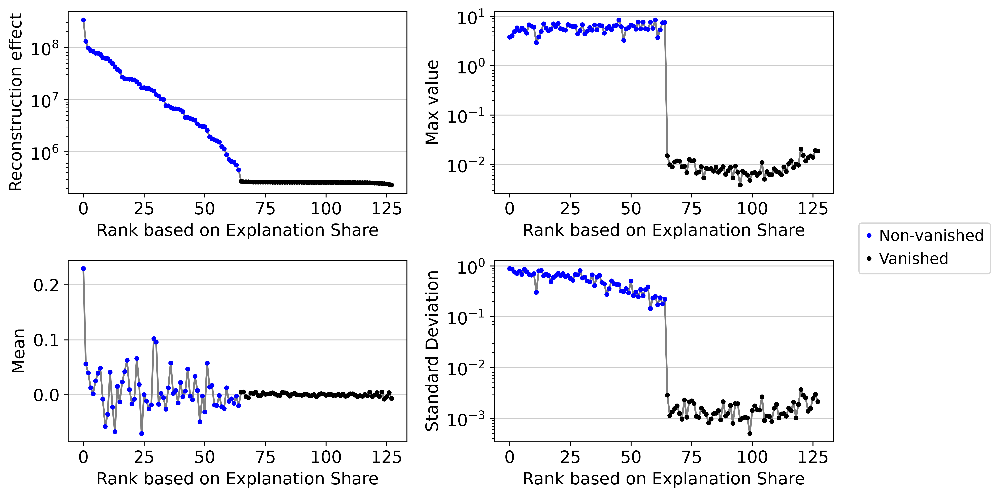

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dimension_stats_drvi_unscaled_128.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dimension_stats_drvi_unscaled_128.png')

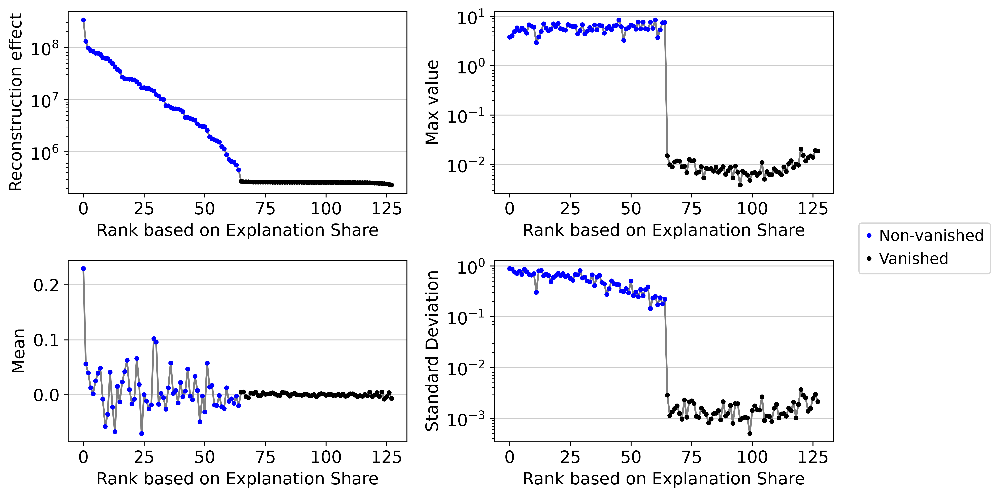

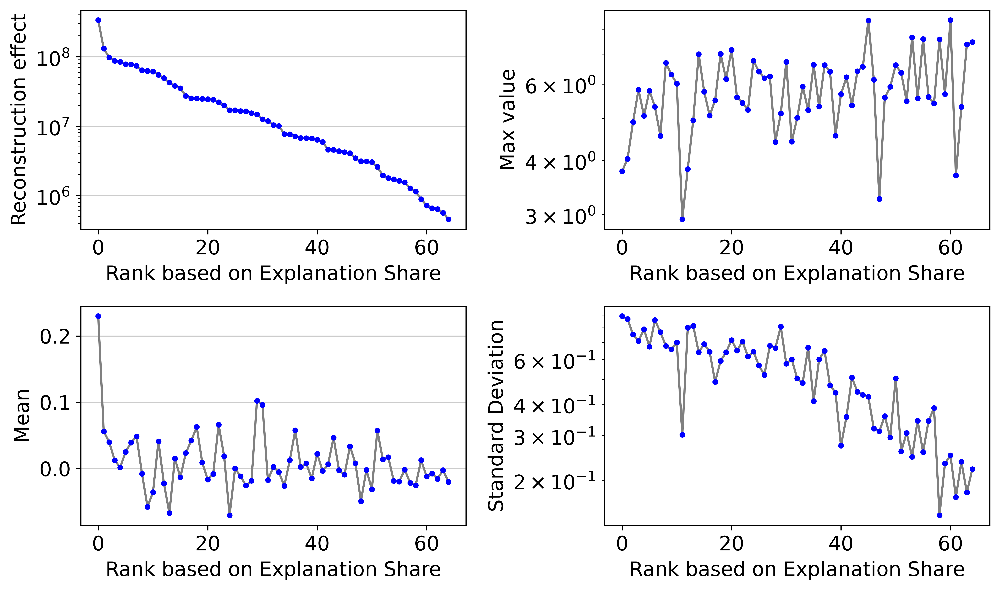

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dimension_stats_rmVanished_drvi_unscaled_128.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dimension_stats_rmVanished_drvi_unscaled_128.png')

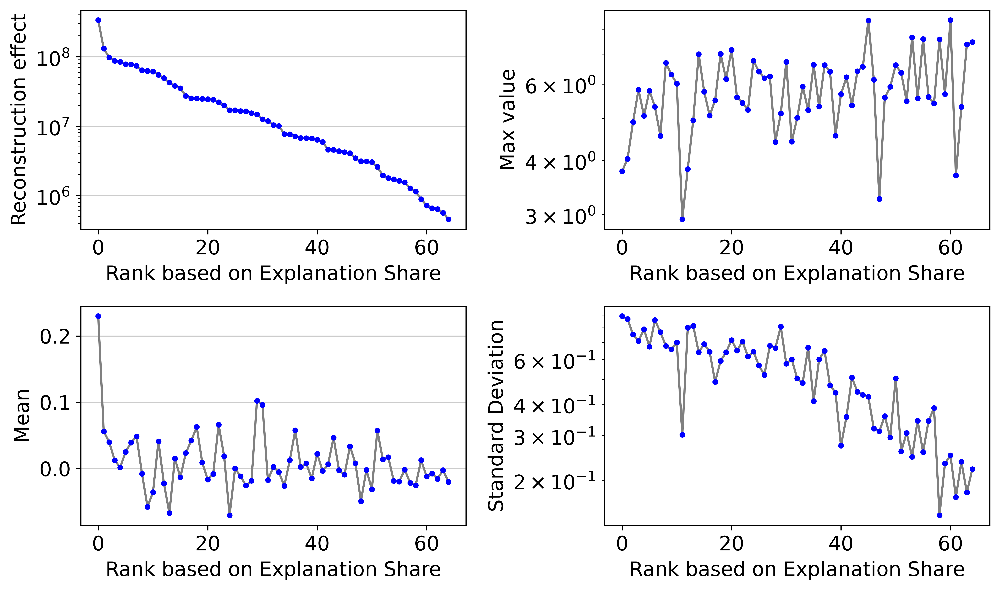

In [50]:
# Per-dimension statistics: reconstruction effect, max value, mean, std.
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2, show=False)
savefig("latent_dimension_stats")
plt.show()

# The same, vanished dimensions dropped: the informative half of the plot above.
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2, remove_vanished=True, show=False)
savefig("latent_dimension_stats_rmVanished")
plt.show()

In [ ]:
# Every non-vanished dimension on the UMAP (remove_vanished defaults to True here).
drvi.utils.pl.plot_latent_dims_in_umap(embed, show=False)
savefig("latent_dims_in_umap")
plt.show()

{'heatmap_ax': <Axes: >, 'groupby_ax': <Axes: ylabel='cell_type'>}

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_cell_type_drvi_unscaled_128.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_cell_type_drvi_unscaled_128.png')

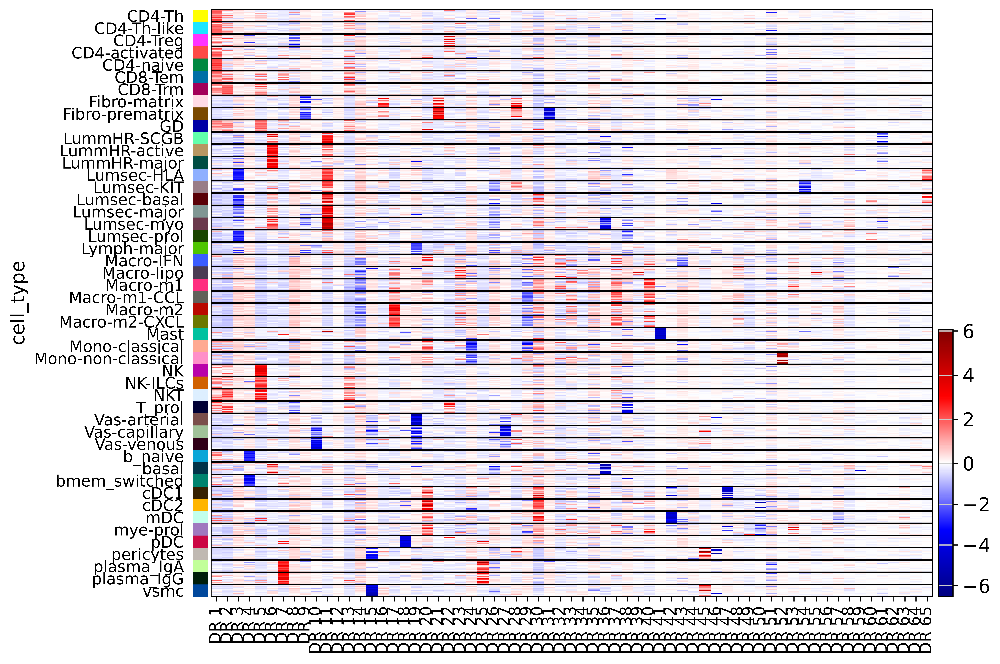

{'heatmap_ax': <Axes: >, 'groupby_ax': <Axes: ylabel='cell_type'>}

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_cell_type_sorted_drvi_unscaled_128.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_cell_type_sorted_drvi_unscaled_128.png')

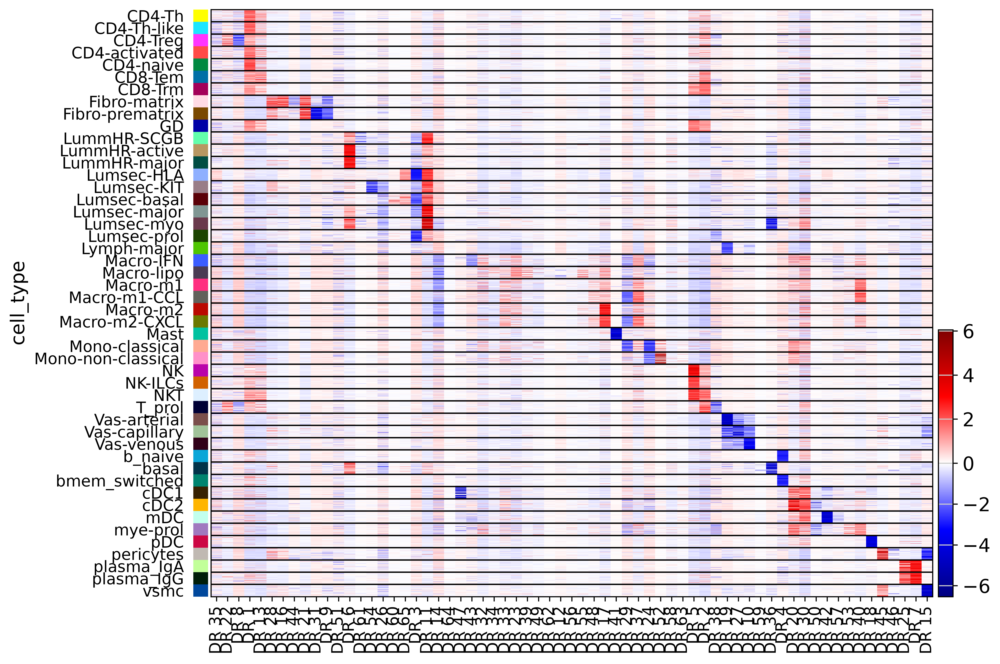

In [52]:
# Which dimension responds to which cell type. Sorted by dimension first, then grouped by
# label: the second ordering makes it obvious when one label owns a whole dimension.
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "cell_type", title_col="title", show=False)
savefig("latent_dims_in_heatmap_cell_type")
plt.show()

drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "cell_type", title_col="title",
                                          sort_by_categorical=True, show=False)
savefig("latent_dims_in_heatmap_cell_type_sorted")
plt.show()

{'heatmap_ax': <Axes: >, 'groupby_ax': <Axes: ylabel='cohort'>}

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_cohort_drvi_unscaled_128.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_cohort_drvi_unscaled_128.png')

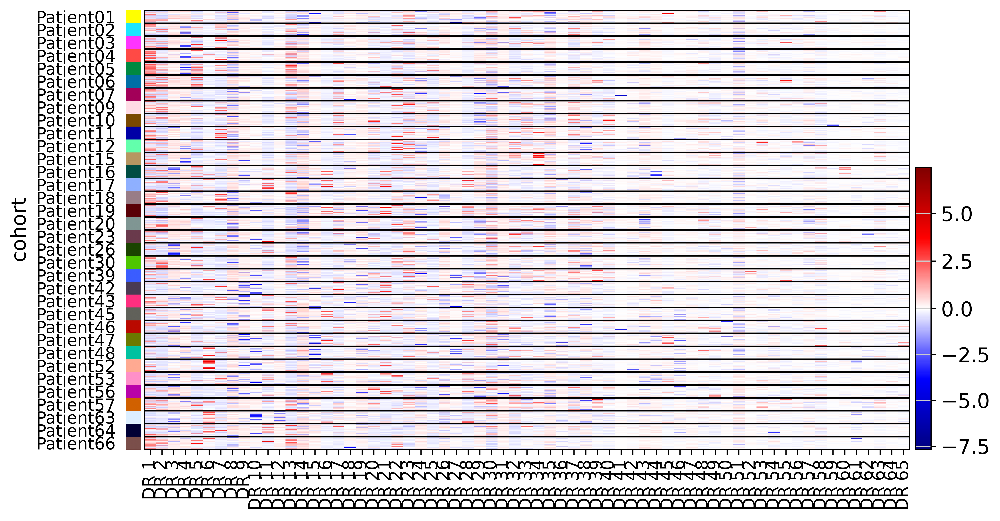

{'heatmap_ax': <Axes: >, 'groupby_ax': <Axes: ylabel='treatment'>}

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_treatment_drvi_unscaled_128.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_treatment_drvi_unscaled_128.png')

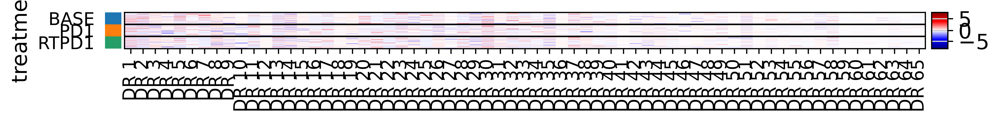

{'heatmap_ax': <Axes: >, 'groupby_ax': <Axes: ylabel='phase'>}

[fig] /home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_phase_drvi_unscaled_128.png


PosixPath('/home/albertoc/Desktop/QCB-Master-Thesis/02_integration_benchmark/figures/drvi_unscaled_128/latent_dims_in_heatmap_phase_drvi_unscaled_128.png')

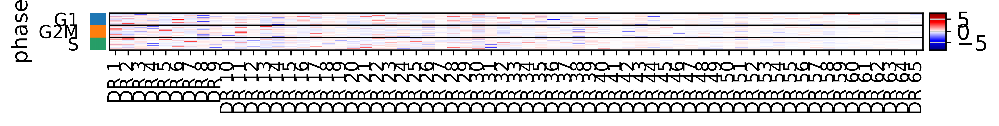

In [54]:
# The same heatmap against the batch
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "cohort", title_col="title", show=False)
savefig("latent_dims_in_heatmap_cohort")
plt.show()

# And against treatment
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "treatment", title_col="title", show=False)
savefig("latent_dims_in_heatmap_treatment")
plt.show()

# And against phase
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "phase", title_col="title", show=False)
savefig("latent_dims_in_heatmap_phase")
plt.show()

### Interpretability (OOD scores)

The out-of-distribution scores come from the decoder reconstructions, so they are fast and
they favour the genes that are *specific* to a dimension.

In [ ]:
model.plot_interpretability_scores(embed, adata, show=False)
savefig("ood_interpretability_scores")
plt.show()

In [56]:
# Genes (rows) appear in adata order and are not sorted.
ood_scores = model.get_interpretability_scores(embed, adata)
ood_scores.iloc[:10, :10]

title,DR 1+,DR 1-,DR 2+,DR 2-,DR 3+,DR 3-,DR 4+,DR 4-,DR 5+,DR 5-
ISG15,0.076498,0.000000e+00,6.925867e-02,8.559950e-13,5.177566e-10,0.026598,9.399895e-11,0.075904,3.470261e-02,6.995084e-12
TNFRSF18,0.021888,0.000000e+00,8.989433e-02,0.000000e+00,0.000000e+00,0.011833,0.000000e+00,0.000235,2.347391e-02,0.000000e+00
TNFRSF4,0.077811,0.000000e+00,9.044420e-04,0.000000e+00,0.000000e+00,0.000039,0.000000e+00,0.000009,2.066069e-03,0.000000e+00
TAS1R3,0.000139,4.279975e-13,1.295046e-05,3.744978e-13,0.000000e+00,0.042738,0.000000e+00,0.002478,2.261837e-05,1.671865e-13
MXRA8,0.000002,0.000000e+00,7.515069e-07,0.000000e+00,0.000000e+00,0.035531,0.000000e+00,0.000002,4.406118e-07,8.292451e-13
MMP23B,0.000030,0.000000e+00,1.782529e-04,0.000000e+00,0.000000e+00,0.000125,0.000000e+00,0.000004,1.600423e-02,0.000000e+00
SMIM1,0.001157,3.018720e-11,1.663041e-04,2.340611e-11,8.426201e-13,0.157513,2.739184e-11,0.000454,1.453873e-04,5.177432e-11
TNFRSF25,0.517483,0.000000e+00,4.854873e-02,0.000000e+00,0.000000e+00,0.024470,0.000000e+00,0.000115,9.436466e-03,0.000000e+00
TNFRSF9,0.000668,0.000000e+00,1.784592e+00,0.000000e+00,0.000000e+00,0.000002,0.000000e+00,0.000094,3.956473e-03,0.000000e+00
RBP7,0.000003,0.000000e+00,3.027070e-07,0.000000e+00,0.000000e+00,0.011106,0.000000e+00,0.000003,4.720002e-08,0.000000e+00


The two halves of `OOD_combined`: the min_possible and max_possible log-fold-changes of each
dimension in the OOD setting. See the paper appendix for how they combine.

In [57]:
ood_max = model.get_interpretability_scores(embed, adata, key="OOD_max_possible")
ood_min = model.get_interpretability_scores(embed, adata, key="OOD_min_possible")
ood_max.iloc[:10, :10]
ood_min.iloc[:10, :10]

title,DR 1+,DR 1-,DR 2+,DR 2-,DR 3+,DR 3-,DR 4+,DR 4-,DR 5+,DR 5-
ISG15,2.682964,1.192093e-06,2.602447,1.438926e-05,3.095234e-04,1.564420,1.345943e-04,2.674351,2.156563,3.531400e-05
TNFRSF18,1.678510,0.000000e+00,2.506697,0.000000e+00,6.731819e-07,1.062412,7.012311e-08,0.262127,1.671134,1.402462e-08
TNFRSF4,2.841947,0.000000e+00,0.609950,0.000000e+00,7.292804e-07,0.103164,2.804924e-08,0.073754,0.874090,0.000000e+00
TAS1R3,0.018786,9.817236e-07,0.005656,9.957482e-07,0.000000e+00,0.075908,1.402462e-08,0.077952,0.007559,6.030588e-07
MXRA8,0.023003,1.416487e-06,0.014621,2.678703e-06,1.542709e-07,1.295810,2.861023e-06,0.024478,0.011732,6.311080e-06
MMP23B,0.085957,1.093921e-06,0.196025,3.365909e-07,0.000000e+00,0.126628,2.412235e-06,0.030713,1.383483,0.000000e+00
SMIM1,0.170522,2.778278e-05,0.064420,2.350527e-05,2.103693e-06,1.173700,2.447297e-05,0.108725,0.062250,3.479509e-05
TNFRSF25,2.396450,0.000000e+00,1.137203,0.000000e+00,6.731819e-07,0.681457,2.804925e-07,0.075432,0.591588,9.817236e-08
TNFRSF9,0.277952,0.000000e+00,3.889789,0.000000e+00,3.085417e-07,0.011042,3.786648e-07,0.108290,0.612296,4.207387e-08
RBP7,0.032873,0.000000e+00,0.010755,1.402462e-07,1.809176e-06,0.957900,5.890341e-07,0.034688,0.004384,3.786648e-07


title,DR 1+,DR 1-,DR 2+,DR 2-,DR 3+,DR 3-,DR 4+,DR 4-,DR 5+,DR 5-
ISG15,0.028361,0.000000e+00,0.026096,2.804924e-08,6.451326e-07,0.011053,2.524432e-07,0.028214,0.015812,5.609849e-08
TNFRSF18,0.012935,0.000000e+00,0.034735,0.000000e+00,0.000000e+00,0.007237,0.000000e+00,0.000880,0.013277,0.000000e+00
TNFRSF4,0.027376,0.000000e+00,0.001412,0.000000e+00,0.000000e+00,0.000172,0.000000e+00,0.000125,0.002328,0.000000e+00
TAS1R3,0.007270,4.347633e-07,0.002151,3.365909e-07,0.000000e+00,0.036239,2.804924e-08,0.031383,0.002884,2.664678e-07
MXRA8,0.000071,0.000000e+00,0.000045,0.000000e+00,0.000000e+00,0.014333,0.000000e+00,0.000076,0.000036,5.609849e-08
MMP23B,0.000331,0.000000e+00,0.000807,0.000000e+00,0.000000e+00,0.000518,0.000000e+00,0.000114,0.011270,0.000000e+00
SMIM1,0.006772,1.037822e-06,0.002451,9.256251e-07,1.402462e-07,0.099281,9.817236e-07,0.004148,0.002301,1.290265e-06
TNFRSF25,0.215627,0.000000e+00,0.041954,0.000000e+00,0.000000e+00,0.022484,0.000000e+00,0.001511,0.015679,0.000000e+00
TNFRSF9,0.002375,0.000000e+00,0.452494,0.000000e+00,0.000000e+00,0.000087,0.000000e+00,0.000848,0.006329,0.000000e+00
RBP7,0.000076,0.000000e+00,0.000024,0.000000e+00,0.000000e+00,0.005703,0.000000e+00,0.000080,0.000010,0.000000e+00


In [ ]:
model.plot_interpretability_scores(embed, adata, key="OOD_max_possible", show=False)
savefig("ood_max_interpretability_scores")
plt.show()

model.plot_interpretability_scores(embed, adata, key="OOD_min_possible", show=False)
savefig("ood_min_interpretability_scores")
plt.show()

### Interpretability (IND scores)

This approach iterates over all the cells and averages the effect of each latent factor on
each gene; the scores are already stored in `embed`.

They reflect the broad mechanistic effect of a dimension. Genes are not filtered for
uniqueness, so a gene shared by several dimensions keeps a high score in all of them: the
complete picture of what a factor moves, as opposed to the OOD scores' specific one.

In [ ]:
model.plot_interpretability_scores(embed, adata, key="IND_linear_weighted_mean", show=False)
savefig("ind_linear_weighted_mean")
plt.show()

In [60]:
# Genes (rows) appear in adata order and are not sorted.
ind_scores = model.get_interpretability_scores(embed, adata, key="IND_linear_weighted_mean")
ind_scores.iloc[:10, :10]

title,DR 1+,DR 1-,DR 2+,DR 2-,DR 3+,DR 3-,DR 4+,DR 4-,DR 5+,DR 5-
ISG15,1.466216,2.025538e-07,1.202631,4.943194e-07,8.430822e-06,2.016082,5.995714e-06,1.395502,1.315605,3.232832e-07
TNFRSF18,2.130843,4.985571e-10,1.370655,1.121110e-10,1.770040e-07,2.774250,6.359024e-07,1.287127,3.227525,3.734095e-09
TNFRSF4,2.921013,5.859742e-10,0.396924,4.215907e-08,7.916012e-06,0.553190,7.706497e-07,0.872484,2.170071,3.116880e-08
TAS1R3,0.904001,2.211045e-04,0.489095,6.843832e-04,9.123839e-08,0.600365,8.443528e-05,1.568025,0.530265,9.662064e-05
MXRA8,0.784364,2.231430e-04,0.453666,1.264710e-03,7.918121e-08,2.109682,1.697936e-03,0.876655,0.634595,9.803603e-04
MMP23B,0.998356,1.290057e-04,1.082880,1.146932e-04,6.602412e-08,1.364156,8.472929e-04,0.657424,2.692150,6.749501e-06
SMIM1,1.566602,1.676410e-03,0.907440,2.721565e-03,5.814894e-06,2.630782,4.743392e-03,1.617827,1.416900,1.349696e-03
TNFRSF25,3.814398,9.825358e-08,1.334200,2.208630e-06,2.317495e-06,1.801537,9.846051e-05,1.056841,1.062934,8.031781e-06
TNFRSF9,0.697322,2.746615e-06,2.910676,1.195388e-07,6.878954e-05,0.122145,5.577826e-05,0.502580,1.678320,3.158196e-06
RBP7,0.655624,5.321973e-07,0.258242,1.389739e-06,6.992743e-07,2.636104,4.006618e-06,0.513285,0.211217,7.486018e-06
